## Taller Deep Learning

Introducción

Importar librerias

In [7]:
import os 
import numpy as np  
from PIL import Image  
import tensorflow as tf  
from sklearn.model_selection import train_test_split  # Importa función para dividir datos en entrenamiento y prueba
from tensorflow.keras.models import Model, Sequential # Importa la clase Model de Keras
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization,MaxPooling2D, Flatten, Dense  # Importa capas de Keras para construir el modelo
from tensorflow.keras.callbacks import EarlyStopping  # Importa el callback
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

Redimensionar y normalizar imágenes

Este código implementa un pipeline completo de procesamiento de datos para predicción temporal de imágenes satelitales, donde primero redimensiona imágenes de 920x920 a 480x480 píxeles para reducir la carga computacional, luego carga 23 archivos .npy ordenados cronológicamente y aplica normalización individual a cada imagen usando min-max scaling para convertir los valores al rango [0,1], posteriormente crea pares de entrenamiento donde cada imagen en el tiempo t se usa como entrada (X) para predecir la imagen en el tiempo t+1 como salida (y), añadiendo una dimensión de canal con np.newaxis para que las matrices pasen de forma (480,480) a (480,480,1) compatible con redes convolucionales, resultando en arrays X e y con forma (22, 480, 480, 1) que representan 22 ejemplos de entrenamiento donde el modelo aprenderá a predecir el estado futuro de las nubes basándose en su estado actual, lo cual es fundamental para la optimización de plantas fotovoltaicas mediante la predicción del movimiento de nubes en imágenes satelitales.

In [4]:
# Directorio original y reducido
d_original = '/home/fisica/bandas/banda13/ene_01'
d_reducida = '/home/fisica/bandas/banda13/ene_01_reducida_test'


# Función de redimensionado - TAMAÑO PEQUEÑO PARA PRUEBAS
def resize_npy_images(d_original, d_reducida, new_size):  # Define función para redimensionar imágenes .npy
    if not os.path.exists(d_reducida):  # Si el directorio reducido no existe
        os.makedirs(d_reducida)  # Lo crea
    for filename in os.listdir(d_original):  # Recorre los archivos en el directorio original
        if filename.lower().endswith('.npy'):  # Si el archivo es .npy
            img_path = os.path.join(d_original, filename)  # Construye la ruta completa del archivo
            img_array = np.load(img_path)  # Carga el array de la imagen
            
# Se llama a la función para redimensionar imágenes
resize_npy_images(d_original, d_reducida, new_size=(480, 480))  # Llama la función para redimensionar imágenes a 480x480

# Cargar las 23 imágenes
file_list = sorted([f for f in os.listdir(d_reducida) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
file_list = file_list[:23]  # Selecciona solo los primeros 23 archivos
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

images = [np.load(os.path.join(d_reducida, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas

# Normalización simple
images = [(img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8) for img in images]
images = [np.clip(img, 0, 1) for img in images]  # Limita los valores al rango [0, 1]

X = np.array(images[:-1])[..., np.newaxis]  # img_t  # Crea array de entrada con dimensión de canal
y = np.array(images[1:])[..., np.newaxis]   # img_t+1  # Crea array de salida (siguiente imagen) con canal

print(f"Forma de X: {X.shape}")  # Imprime la forma del array de entrada
print(f"Forma de y: {y.shape}")  # Imprime la forma del array de salida

Procesando 23 imágenes
Forma de X: (22, 480, 480, 1)
Forma de y: (22, 480, 480, 1)


## Implementación de una Red Neuronal Convolucional

Este código implementa una red neuronal convolucional secuencial con arquitectura encoder-decoder simétrica que utiliza seis capas Conv2D con filtros que aumentan progresivamente de 16 a 64 canales en las primeras tres capas (extrayendo características cada vez más complejas de las imágenes satelitales) y luego disminuyen simétricamente de 32 a 16 canales para reconstruir la imagen predicha, finalizando con una capa de salida de 1 canal con activación lineal que produce la imagen predicha del tiempo t+1, donde todas las capas usan kernels 3x3 con padding='same' para mantener las dimensiones espaciales constantes (480x480), el modelo se compila con optimizador Adam y función de pérdida MAE (Error Absoluto Medio) que es robusta para datos de radiancia satelital, se entrena durante 10 épocas con lotes de 8 imágenes utilizando EarlyStopping con paciencia de 10 épocas para prevenir sobreentrenamiento y restaurar automáticamente los mejores pesos, creando así un sistema de predicción temporal que aprende patrones espaciales y temporales en el movimiento de nubes para optimización de plantas fotovoltaicas.

In [13]:
# Definición del modelo
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=X.shape[1:]),
    BatchNormalization(),  # 1. Después de la primera capa
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 2. Después de la segunda capa
    
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 3. Después de la tercera capa (pico del encoder)
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 4. Después de la cuarta capa
    
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 5. Después de la quinta capa
    
    Conv2D(1, (3, 3), activation='linear', padding='same')  # SIN BatchNorm en la salida
])

model.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model.summary()

# Entrenamiento 15 épocas, batch size 8, early stopping
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history = model.fit(
    X, y,
    epochs=15,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history.history['loss'][-1]:.4f}")

Resumen del modelo:


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 480, 480, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 480, 480, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 480, 480, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 480, 480, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 480, 480, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 480, 480, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,169 (184.25 KB)

 Trainable params: 46,849 (183.00 KB)

 Non-trainable params: 320 (1.25 KB)

Iniciando entrenamiento de prueba...
Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 16s/step - loss: 3.1883 - mean_absolute_percentage_error: 8586.2344 - root_mean_squared_error: 1.7856
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 1.2366 - mean_absolute_percentage_error: 4827.7949 - root_mean_squared_error: 1.1120
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 48s 15s/step - loss: 0.8970 - mean_absolute_percentage_error: 4222.8667 - root_mean_squared_error: 0.9471
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.7025 - mean_absolute_percentage_error: 3501.4150 - root_mean_squared_error: 0.8381
Epoch 5/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.5795 - mean_absolute_percentage_error: 3509.1331 - root_mean_squared_error: 0.7613
Epoch 6/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.5072 - mean_absolute_percentage_error: 2940.7837 - root_mean_squared_error: 0.7122
Epoch 7/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.4529 - mean_absolute_percentage_error: 2554.8367 - r

In [14]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model.evaluate(X, y, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1479 - mean_absolute_percentage_error: 1626.8719 - root_mean_squared_error: 0.3846
Pérdida (MSE): 0.1479
RMSE: 0.3846
MAPE: 1626.8719


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


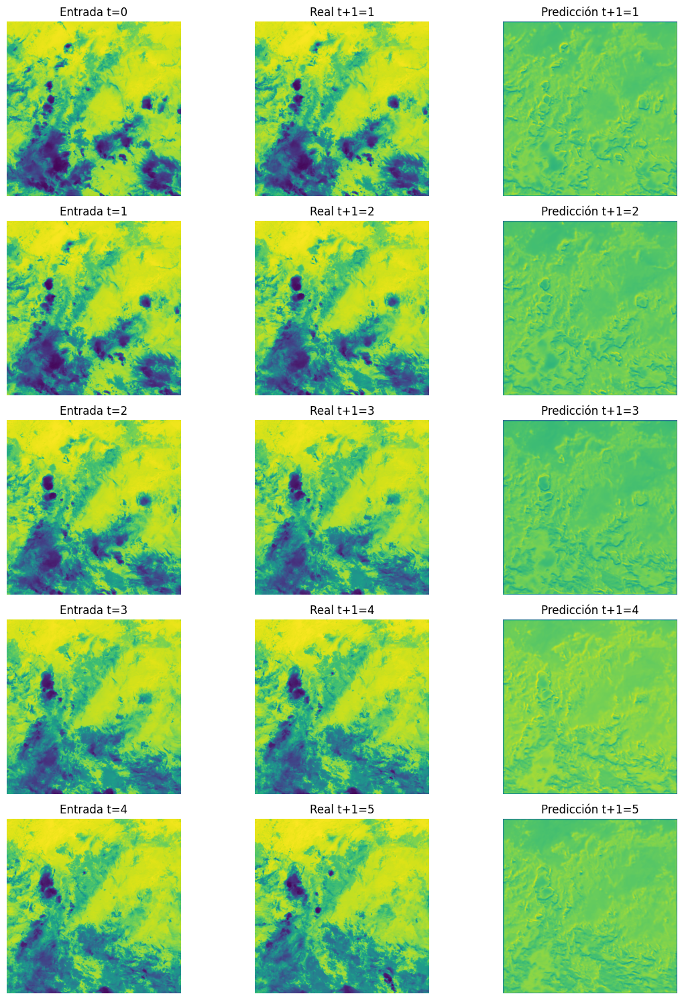

In [15]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

y_pred = model.predict(X)  # Genera las predicciones

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [16]:
# Definición del modelo
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError

model1 = Sequential([
    Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=X.shape[1:]),
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    
    Conv2D(1, (3, 3), activation='linear', padding='same')  # SIN BatchNorm en la salida
])

model1.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model1.summary()

# Entrenamiento 15 épocas, batch size 8, early stopping
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history = model.fit(
    X, y,
    epochs=15,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history.history['loss'][-1]:.4f}")

Resumen del modelo:


/home/fisica/data/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 480, 480, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,529 (181.75 KB)

 Trainable params: 46,529 (181.75 KB)

 Non-trainable params: 0 (0.00 B)

Iniciando entrenamiento de prueba...
Epoch 1/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 17s/step - loss: 0.2128 - mean_absolute_percentage_error: 1481.4523 - root_mean_squared_error: 0.4613
Epoch 2/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 17s/step - loss: 0.1958 - mean_absolute_percentage_error: 1469.0551 - root_mean_squared_error: 0.4424
Epoch 3/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.1792 - mean_absolute_percentage_error: 1353.6932 - root_mean_squared_error: 0.4234
Epoch 4/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1644 - mean_absolute_percentage_error: 1350.7645 - root_mean_squared_error: 0.4055
Epoch 5/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 49s 16s/step - loss: 0.1515 - mean_absolute_percentage_error: 1307.5020 - root_mean_squared_error: 0.3893
Epoch 6/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1368 - mean_absolute_percentage_error: 1247.5399 - root_mean_squared_error: 0.3699
Epoch 7/15
3/3 ━━━━━━━━━━━━━━━━━━━━ 50s 16s/step - loss: 0.1251 - mean_absolute_percentage_error: 1156.7548 - r

In [17]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model1.evaluate(X, y, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.5809 - mean_absolute_percentage_error: 181.0937 - root_mean_squared_error: 0.7622
Pérdida (MSE): 0.5809
RMSE: 0.7622
MAPE: 181.0937


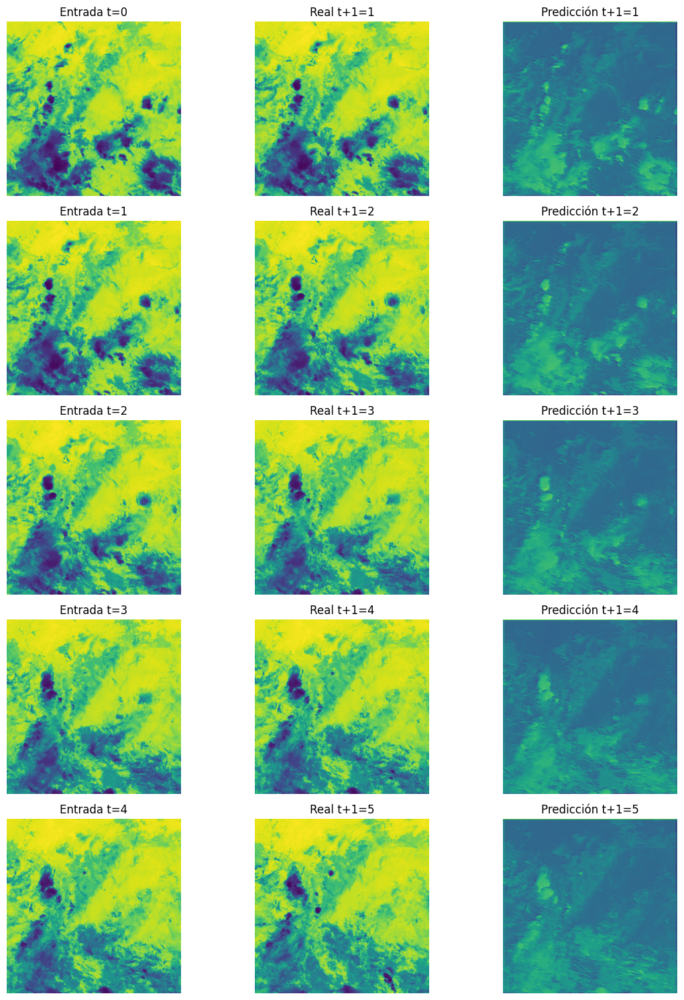

In [19]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


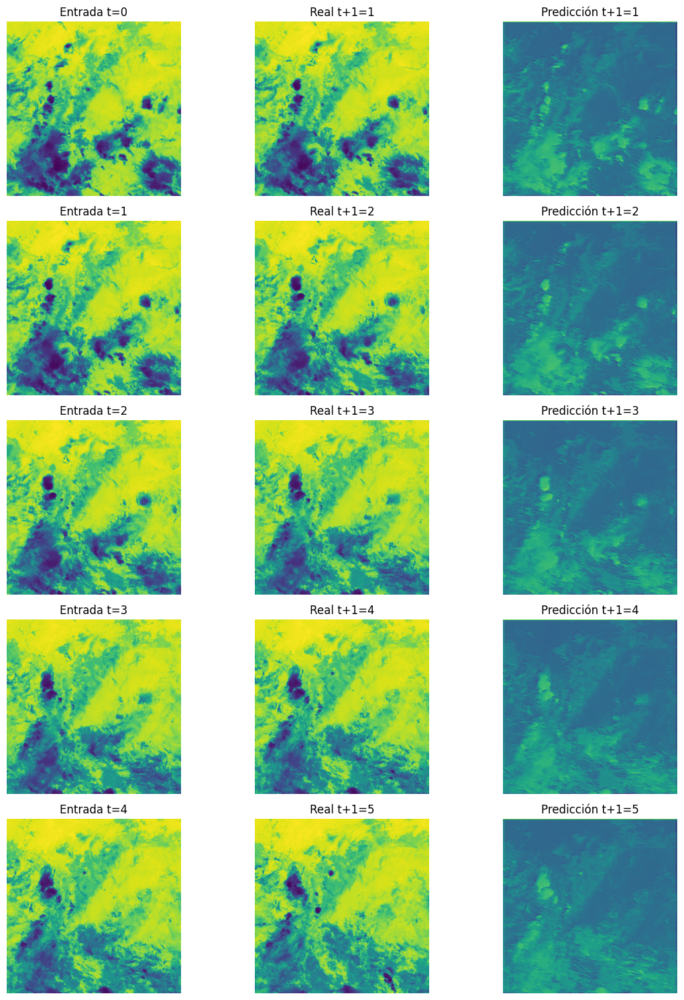

In [18]:
import matplotlib.pyplot as plt

# Selecciona el número de ejemplos a mostrar
n = 5

y_pred = model1.predict(X)  # Genera las predicciones

# Muestra imágenes reales vs predichas usando un mapa de color
fig, axs = plt.subplots(n, 3, figsize=(12, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(y[i, ..., 0], cmap='viridis')
    axs[i, 1].set_title(f'Real t+1={i+1}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Predicción t+1={i+1}')
    axs[i, 2].axis('off')

plt.tight_layout()
plt.show()

### Usando 2 canales el 9 y el 13

In [6]:
# Directorio de las nuevas imágenes 920x920 y su destino reducido
d_original_9 = '/home/fisica/bandas/banda9/ene_01'  # Cambia esta ruta por la ubicación real
d_reducida_9 = '/home/fisica/bandas/banda9/ene_01_reducida'  # Cambia esta ruta por el destino deseado

# Redimensionar las imágenes 920x920 a 480x480 usando la función existente
resize_npy_images(d_original_9, d_reducida_9, new_size=(480, 480))

# Cargar las 23 imágenes
file_list = sorted([f for f in os.listdir(d_reducida_9) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
file_list = file_list[:23]  # Selecciona solo los primeros 23 archivos
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

images_9 = [np.load(os.path.join(d_reducida_9, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas

# Normalización simple
images_9 = [(img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8) for img in images_9]
images_9 = [np.clip(img, 0, 1) for img in images_9]  # Limita los valores al rango [0, 1]
X_1 = np.array(images_9[:-1])[..., np.newaxis]  # img_t  # Crea array de entrada con dimensión de canal
y_1 = np.array(images_9[1:])[..., np.newaxis]   # img_t+1  # Crea array de salida (siguiente imagen) con canal


Procesando 23 imágenes


In [ ]:
X_multi = np.concatenate([X, X_1], axis=-1)  # (n, 480, 480, 2)
y_multi = np.concatenate([y, y_1], axis=-1)  # (n, 480, 480, 2)

model = Sequential([
    Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=X_multi.shape[1:]),
    BatchNormalization(),  # 1. Después de la primera capa
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 2. Después de la segunda capa
    
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 3. Después de la tercera capa (pico del encoder)
    
    Conv2D(32, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 4. Después de la cuarta capa
    
    Conv2D(16, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),  # 5. Después de la quinta capa
    
    Conv2D(1, (3, 3), activation='linear', padding='same')  # SIN BatchNorm en la salida
])

model.compile(
    optimizer="adam", 
    loss="mse", 
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
    )

print("Resumen del modelo:")
model.summary()

# Entrenamiento rápido - solo 3 épocas
print("Iniciando entrenamiento de prueba...")

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_multi, y_multi,
    epochs=10,
    batch_size=8,
    callbacks=[early_stop],
    verbose=1
)
print("¡Prueba completada!")
print(f"Pérdida final: {history.history['loss'][-1]:.4f}")



Resumen del modelo:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 480, 480, 16)   │           304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 480, 480, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 480, 480, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 480, 480, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 480, 480, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 480, 480, 1)    │           145 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,673 (182.32 KB)

 Trainable params: 46,673 (182.32 KB)

 Non-trainable params: 0 (0.00 B)

Iniciando entrenamiento de prueba...
Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 8s/step - loss: 0.5740 - mae: 0.5740
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.2423 - mae: 0.2423
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1871 - mae: 0.1871
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1903 - mae: 0.1903
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.1215 - mae: 0.1215
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 7s/step - loss: 0.1348 - mae: 0.1348
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.1039 - mae: 0.1039
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.1135 - mae: 0.1135
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - loss: 0.0999 - mae: 0.0999
Epoch 10/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 8s/step - loss: 0.0967 - mae: 0.0967
¡Prueba completada!
Pérdida final: 0.0967


2025-09-24 19:56:04.348934: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 648806400 exceeds 10% of free system memory.
2025-09-24 19:56:04.627000: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 1297612800 exceeds 10% of free system memory.


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


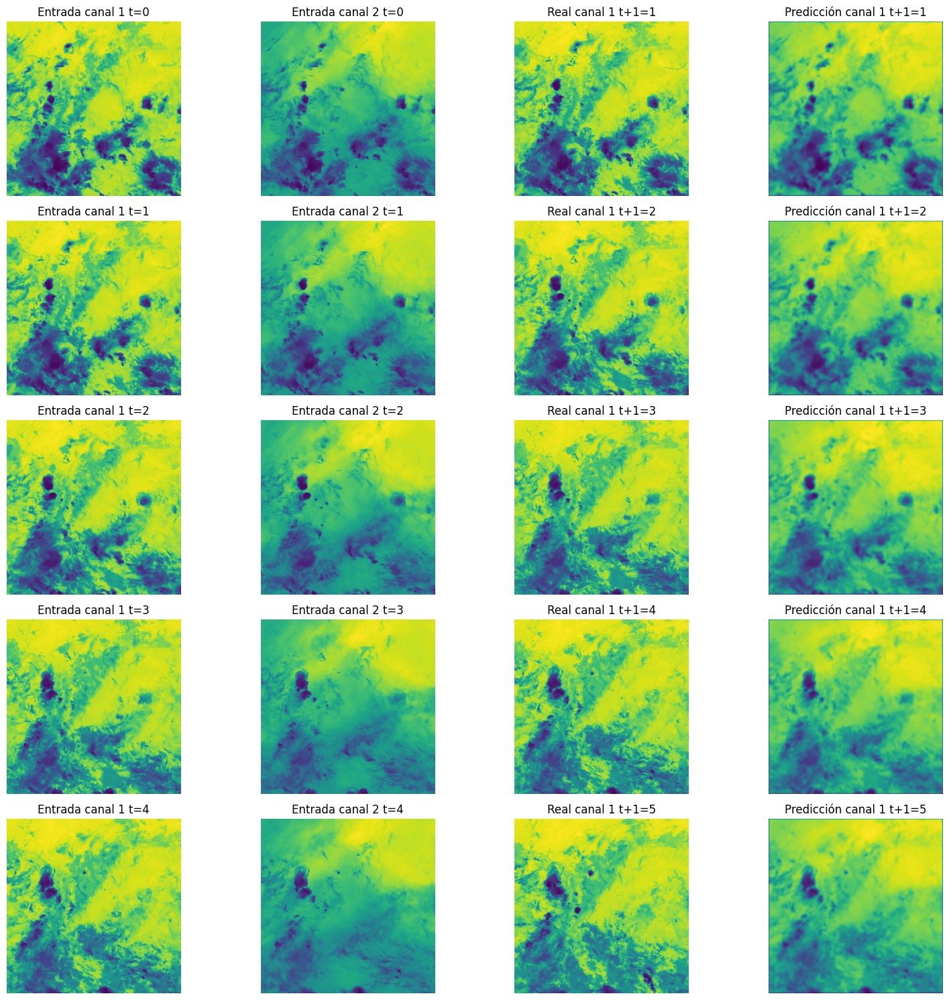

In [8]:
import matplotlib.pyplot as plt

# Generar predicciones con el modelo entrenado
y_pred = model.predict(X_multi)

# Número de ejemplos a mostrar
n = 5

fig, axs = plt.subplots(n, 4, figsize=(16, 3 * n))

for i in range(n):
    axs[i, 0].imshow(X_multi[i, ..., 0], cmap='viridis')
    axs[i, 0].set_title(f'Entrada canal 1 t={i}')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(X_multi[i, ..., 1], cmap='viridis')
    axs[i, 1].set_title(f'Entrada canal 2 t={i}')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(y_multi[i, ..., 0], cmap='viridis')
    axs[i, 2].set_title(f'Real canal 1 t+1={i+1}')
    axs[i, 2].axis('off')

    axs[i, 3].imshow(y_pred[i, ..., 0], cmap='viridis')
    axs[i, 3].set_title(f'Predicción canal 1 t+1={i+1}')
    axs[i, 3].axis('off')

plt.tight_layout()
plt.show()